In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import PIL
from tensorflow.keras import Model

In [2]:
# Load the pre-trained VGG19 model 
vgg = tf.keras.applications.VGG19(include_top=True, weights=None)
# we have downloaded the imagenet weighgt instead of downloading it again and again
vgg.load_weights('vgg19_weights_tf_dim_ordering_tf_kernels.h5') 
for layers in vgg.layers:
  print(f"{layers.name} ---> {layers.output_shape}")



input_1 ---> [(None, 224, 224, 3)]
block1_conv1 ---> (None, 224, 224, 64)
block1_conv2 ---> (None, 224, 224, 64)
block1_pool ---> (None, 112, 112, 64)
block2_conv1 ---> (None, 112, 112, 128)
block2_conv2 ---> (None, 112, 112, 128)
block2_pool ---> (None, 56, 56, 128)
block3_conv1 ---> (None, 56, 56, 256)
block3_conv2 ---> (None, 56, 56, 256)
block3_conv3 ---> (None, 56, 56, 256)
block3_conv4 ---> (None, 56, 56, 256)
block3_pool ---> (None, 28, 28, 256)
block4_conv1 ---> (None, 28, 28, 512)
block4_conv2 ---> (None, 28, 28, 512)
block4_conv3 ---> (None, 28, 28, 512)
block4_conv4 ---> (None, 28, 28, 512)
block4_pool ---> (None, 14, 14, 512)
block5_conv1 ---> (None, 14, 14, 512)
block5_conv2 ---> (None, 14, 14, 512)
block5_conv3 ---> (None, 14, 14, 512)
block5_conv4 ---> (None, 14, 14, 512)
block5_pool ---> (None, 7, 7, 512)
flatten ---> (None, 25088)
fc1 ---> (None, 4096)
fc2 ---> (None, 4096)
predictions ---> (None, 1000)


In [3]:
# Function to compute the Gram matrix for a given tensor
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  gram_matrix = tf.expand_dims(result, axis=0)
  input_shape = tf.shape(input_tensor)
  i_j = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return gram_matrix/i_j 

In [4]:
# Function to load the VGG19 model with specified content and style layers
def load_vgg():
  vgg = tf.keras.applications.VGG19(include_top=True, weights=None)
  vgg.load_weights('vgg19_weights_tf_dim_ordering_tf_kernels.h5')
  vgg.trainable = False
  content_layers = ['block4_conv2']
  style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
  content_output = vgg.get_layer(content_layers[0]).output 
  style_output = [vgg.get_layer(style_layer).output for style_layer in style_layers]
  gram_style_output = [gram_matrix(output_) for output_ in style_output]

  model = Model([vgg.input], [content_output, gram_style_output])
  return model

In [5]:
# Function to calculate the total loss using content and style targets
def loss_object(style_outputs, content_outputs, style_target, content_target):
  style_weight = 1e-2
  content_weight = 1e-1
  content_loss = tf.reduce_mean((content_outputs - content_target)**2)
  style_loss = tf.add_n([tf.reduce_mean((output_ - target_)**2) for output_, target_ in zip(style_outputs, style_target)])
  total_loss = content_weight*content_loss + style_weight*style_loss
  return total_loss

In [6]:
# Function to load and preprocess content and style images
def load_image(content_image_path,style_image_path):
    content_image = cv2.resize(cv2.imread(content_image_path), (224, 224))
    content_image = tf.image.convert_image_dtype(content_image, tf.float32)
    style_image = cv2.resize(cv2.imread(style_image_path), (224, 224))
    style_image = tf.image.convert_image_dtype(style_image, tf.float32)

    # plt.subplot(1, 2, 1)
    # plt.imshow(cv2.cvtColor(np.array(content_image), cv2.COLOR_BGR2RGB))
    # plt.subplot(1, 2, 2)
    # plt.imshow(cv2.cvtColor(np.array(style_image), cv2.COLOR_BGR2RGB))
    # plt.show()

    return content_image,style_image

In [7]:
# Paths for content and style images
content_path = 'content'
style_path = 'styles'
content_images_paths = []
style_images_paths = []

# Populate lists with paths to content and style images
for path in os.listdir(content_path):
    content_images_paths.append(os.path.join(content_path,path))
    print(os.path.join(content_path,path))

for path in os.listdir(style_path):
    style_images_paths.append(os.path.join(style_path,path))
    print(os.path.join(style_path,path))


content\cat_input.jpg
content\chicago.jpg
content\dancing.jpg
content\stata.jpg
styles\style_1.jpg
styles\style_2.jpg
styles\style_3.jpg
styles\style_4.jpg
styles\style_5.jpg


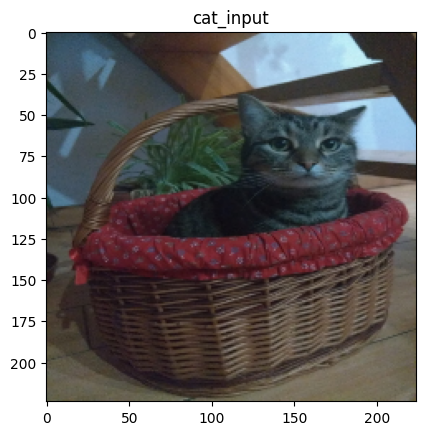

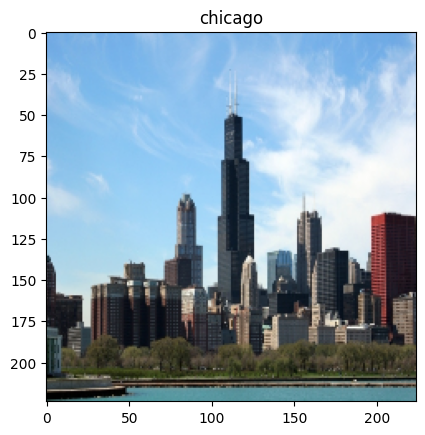

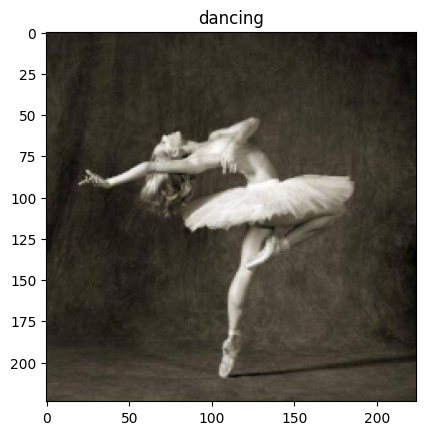

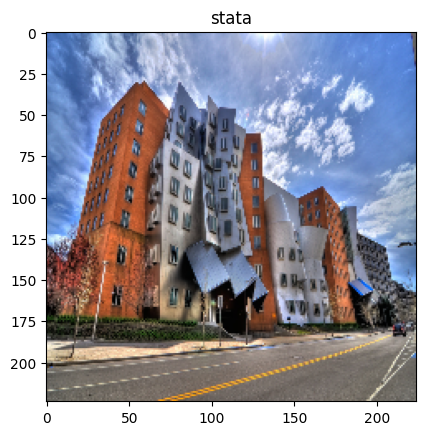

In [8]:
# Display content images with titles
for pathc in content_images_paths:
    content_image = cv2.resize(cv2.imread(pathc), (224, 224))
    content_image = tf.image.convert_image_dtype(content_image, tf.float32)
    plt.plot()
    plt.imshow(cv2.cvtColor(np.array(content_image), cv2.COLOR_BGR2RGB))
    plt.title(pathc[8:-4])
    plt.show()

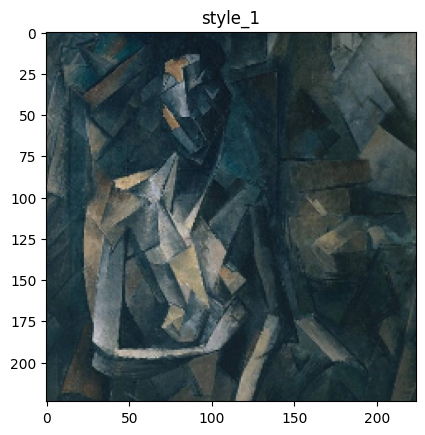

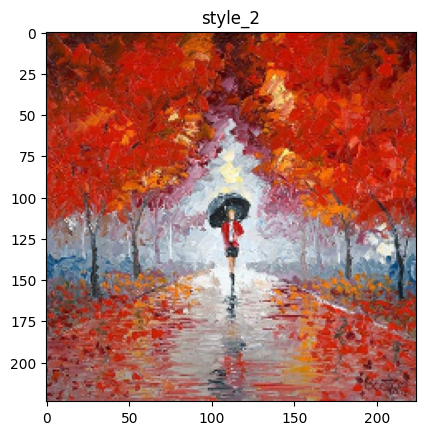

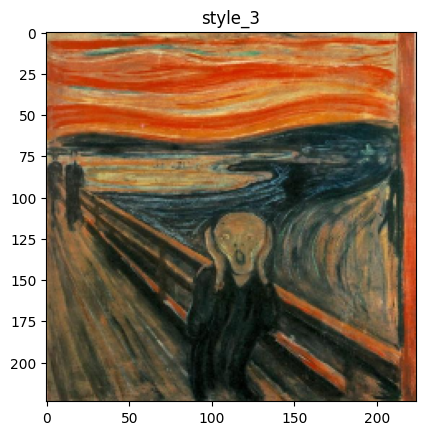

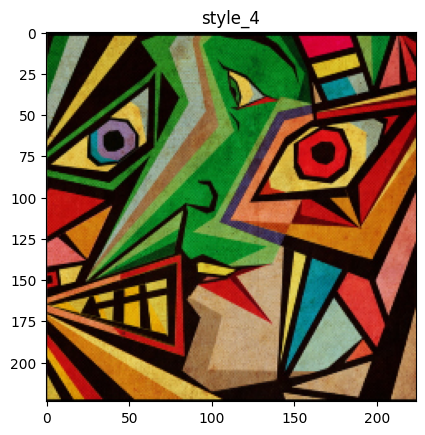

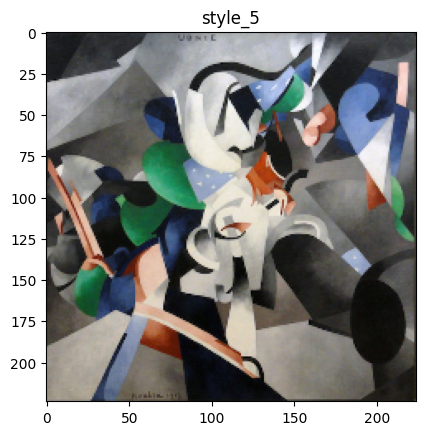

In [9]:
# Display style images with titles
for paths in style_images_paths:
    style_image = cv2.resize(cv2.imread(paths), (224, 224))
    style_image = tf.image.convert_image_dtype(style_image, tf.float32)
    plt.plot()
    plt.imshow(cv2.cvtColor(np.array(style_image), cv2.COLOR_BGR2RGB))
    plt.title(paths[7:-4])
    plt.show()

In [10]:
# Function to perform a training step on the image
def train_step(image, epoch,content_target,style_target,):
  with tf.GradientTape() as tape:
    output = vgg_model(image*255)
    loss = loss_object(output[1], output[0], style_target, content_target)
  gradient = tape.gradient(loss, image)
  opt.apply_gradients([(gradient, image)])
    # Clip values to be within a certain range
  image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))

  if epoch % 5 ==0:
    tf.print(f"Loss = {loss}")

content\cat_input.jpg styles\style_1.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 477340256.0
Loss = 73405408.0
Loss = 49549400.0
Loss = 41434020.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = cat_input and STYLE_IMAGE = style_1####################################


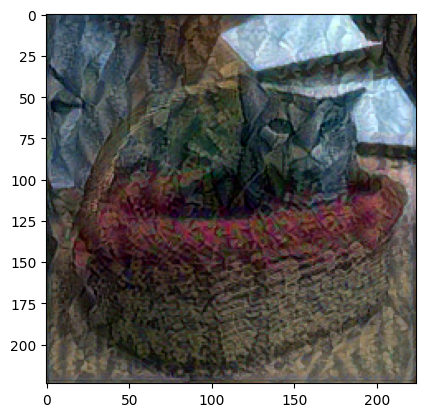

##############################################################################################################################
content\cat_input.jpg styles\style_2.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 5789849088.0
Loss = 1559747968.0
Loss = 853126912.0
Loss = 912188480.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = cat_input and STYLE_IMAGE = style_2####################################


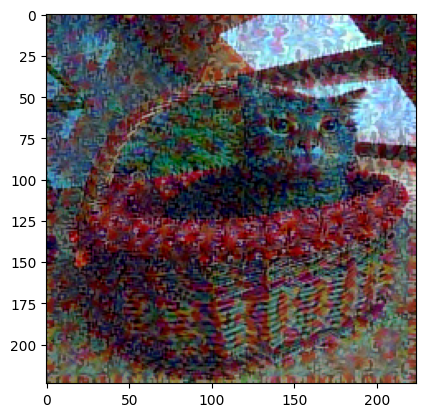

##############################################################################################################################
content\cat_input.jpg styles\style_3.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 1236104576.0
Loss = 393360480.0
Loss = 294795296.0
Loss = 205773168.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = cat_input and STYLE_IMAGE = style_3####################################


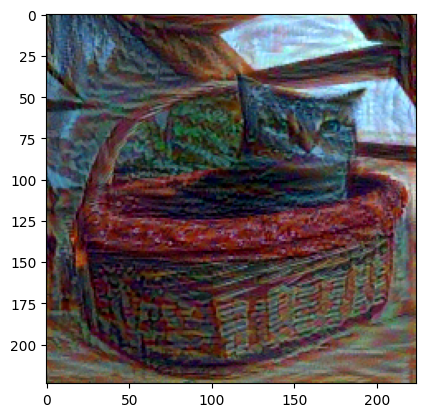

##############################################################################################################################
content\cat_input.jpg styles\style_4.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 12947577856.0
Loss = 6451976704.0
Loss = 3668645632.0
Loss = 2840899072.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = cat_input and STYLE_IMAGE = style_4####################################


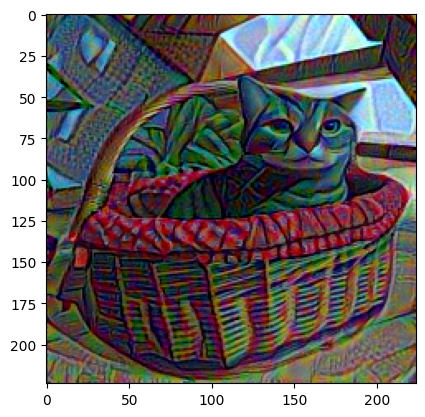

##############################################################################################################################
content\cat_input.jpg styles\style_5.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 4061173760.0
Loss = 1319742848.0
Loss = 873359040.0
Loss = 604756800.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = cat_input and STYLE_IMAGE = style_5####################################


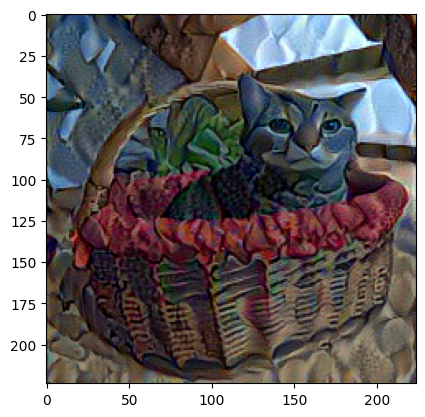

##############################################################################################################################
content\chicago.jpg styles\style_1.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 3025185536.0
Loss = 599628672.0
Loss = 471375296.0
Loss = 399130400.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = chicago and STYLE_IMAGE = style_1####################################


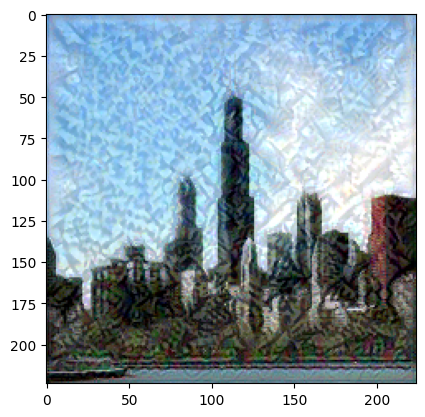

##############################################################################################################################
content\chicago.jpg styles\style_2.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 5102776320.0
Loss = 1538537728.0
Loss = 1152845568.0
Loss = 937705280.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = chicago and STYLE_IMAGE = style_2####################################


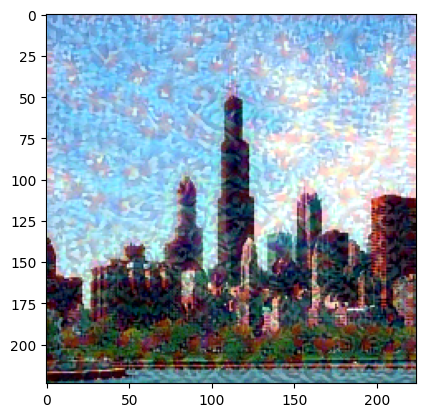

##############################################################################################################################
content\chicago.jpg styles\style_3.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 2752464384.0
Loss = 740735040.0
Loss = 601440896.0
Loss = 511290176.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = chicago and STYLE_IMAGE = style_3####################################


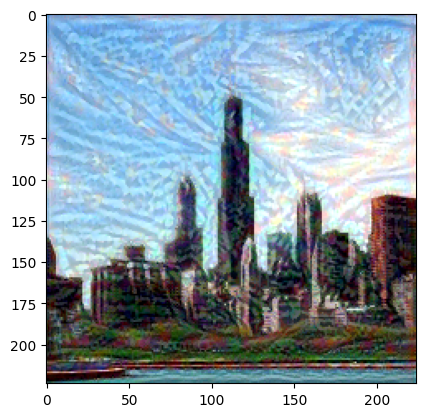

##############################################################################################################################
content\chicago.jpg styles\style_4.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 11309602816.0
Loss = 5264366592.0
Loss = 3114474240.0
Loss = 2479794432.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = chicago and STYLE_IMAGE = style_4####################################


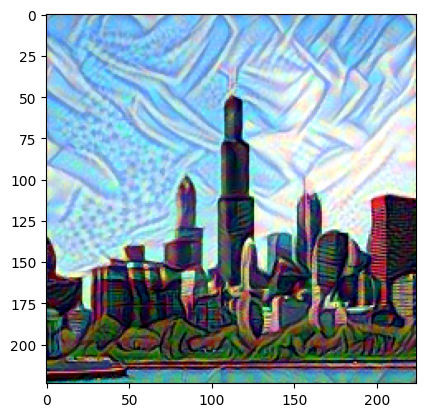

##############################################################################################################################
content\chicago.jpg styles\style_5.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 3129976576.0
Loss = 790092416.0
Loss = 511694848.0
Loss = 399572256.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = chicago and STYLE_IMAGE = style_5####################################


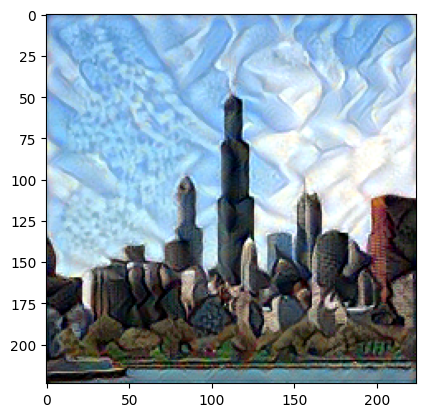

##############################################################################################################################
content\dancing.jpg styles\style_1.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 279221280.0
Loss = 54836852.0
Loss = 30275038.0
Loss = 26880814.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = dancing and STYLE_IMAGE = style_1####################################


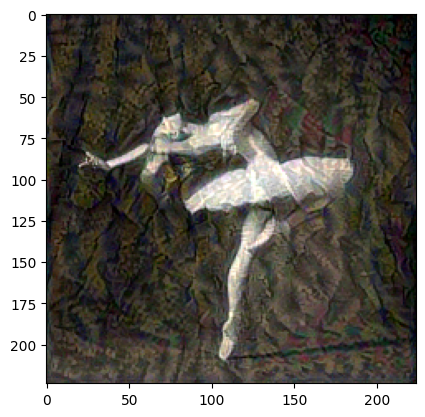

##############################################################################################################################
content\dancing.jpg styles\style_2.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 7148105728.0
Loss = 2751112704.0
Loss = 1151157760.0
Loss = 1167068288.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = dancing and STYLE_IMAGE = style_2####################################


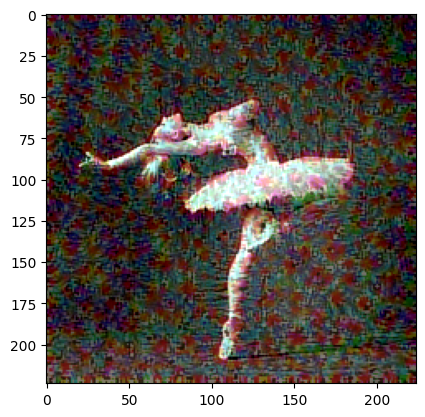

##############################################################################################################################
content\dancing.jpg styles\style_3.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 2241898752.0
Loss = 659871872.0
Loss = 521629216.0
Loss = 468629344.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = dancing and STYLE_IMAGE = style_3####################################


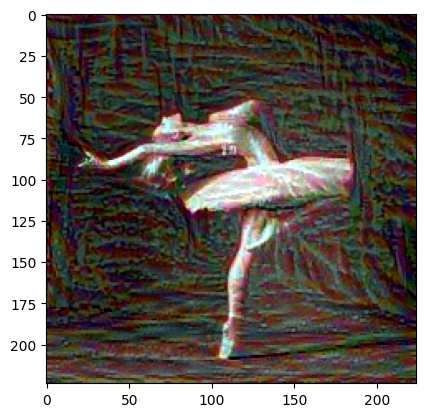

##############################################################################################################################
content\dancing.jpg styles\style_4.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 15597931520.0
Loss = 9650477056.0
Loss = 5425866240.0
Loss = 4028319232.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = dancing and STYLE_IMAGE = style_4####################################


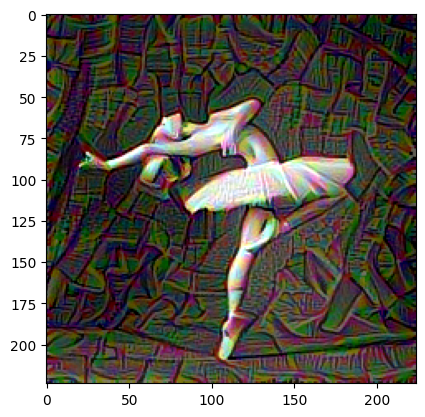

##############################################################################################################################
content\dancing.jpg styles\style_5.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 5136349696.0
Loss = 1690149376.0
Loss = 1226279936.0
Loss = 903144512.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = dancing and STYLE_IMAGE = style_5####################################


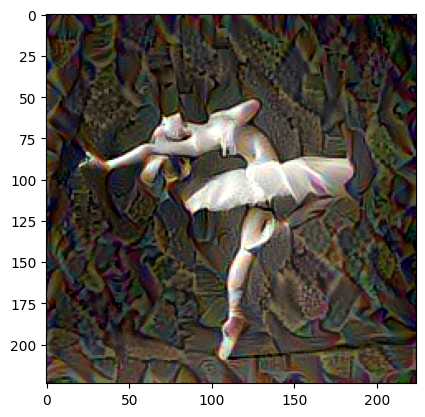

##############################################################################################################################
content\stata.jpg styles\style_1.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 4878433280.0
Loss = 915952640.0
Loss = 655027968.0
Loss = 536083392.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = stata and STYLE_IMAGE = style_1####################################


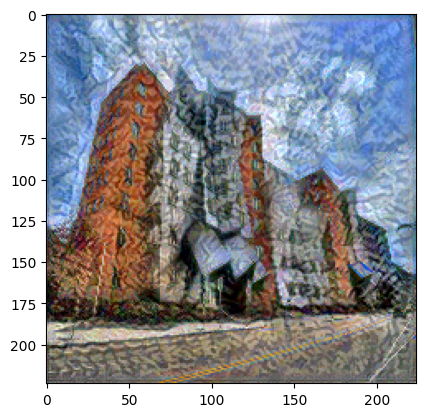

##############################################################################################################################
content\stata.jpg styles\style_2.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 4125575424.0
Loss = 1110502400.0
Loss = 829302784.0
Loss = 610250112.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = stata and STYLE_IMAGE = style_2####################################


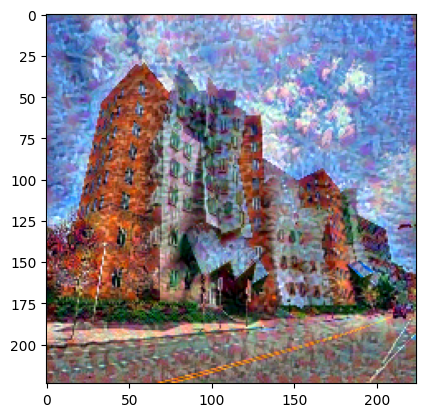

##############################################################################################################################
content\stata.jpg styles\style_3.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 3898426880.0
Loss = 811032960.0
Loss = 634220544.0
Loss = 537817280.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = stata and STYLE_IMAGE = style_3####################################


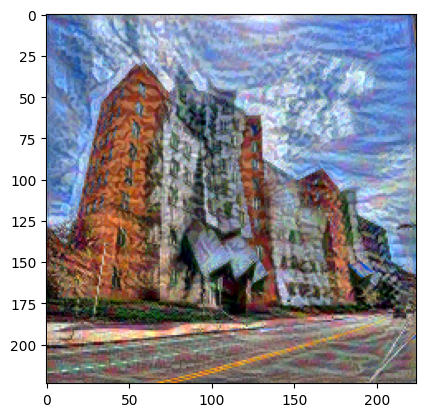

##############################################################################################################################
content\stata.jpg styles\style_4.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 10772889600.0
Loss = 4378941440.0
Loss = 2682753536.0
Loss = 2232381952.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = stata and STYLE_IMAGE = style_4####################################


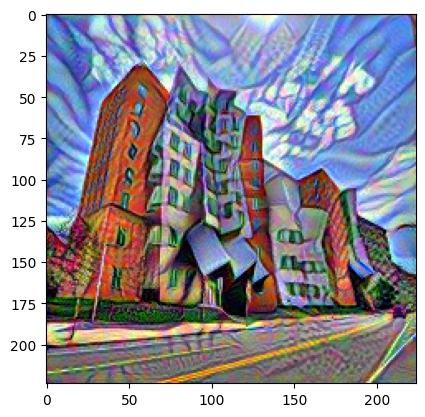

##############################################################################################################################
content\stata.jpg styles\style_5.jpg
-------------------------------------------------------START TRAINING---------------------------------------------------------
Loss = 2722973184.0
Loss = 598652864.0
Loss = 379414784.0
Loss = 292501920.0
-------------------------------------------------------END TRAINING-----------------------------------------------------------
###########################---INPUT_IMAGE = stata and STYLE_IMAGE = style_5####################################


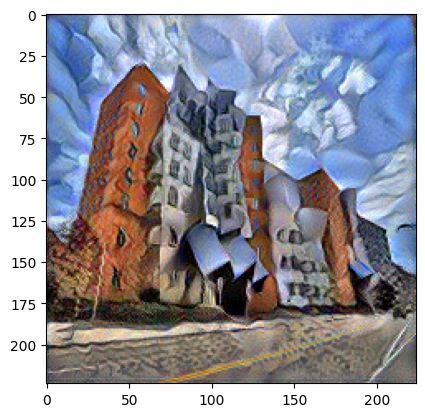

##############################################################################################################################


In [11]:
# Iterate over content and style image pairs
for pathc in content_images_paths:
    for paths in style_images_paths:
        print(pathc,paths)
        c,s = load_image(pathc,paths)

        # Create an Adam optimizer
        opt = tf.optimizers.Adam(learning_rate=0.01, beta_1=0.99, epsilon=1e-1)
        # print(c,s)

        #Load model
        vgg_model = load_vgg()

        # Get the content and style Target from the VGG model
        content_target = vgg_model(np.array([c*255]))[0]
        style_target = vgg_model(np.array([s*255]))[1]

        EPOCHS = 20
        image = tf.image.convert_image_dtype(c, tf.float32)
        image = tf.Variable([image])
        print("-------------------------------------------------------START TRAINING---------------------------------------------------------")
        for i in range(EPOCHS):
            train_step(image, i,content_target,style_target)

        print("-------------------------------------------------------END TRAINING-----------------------------------------------------------")

        print(f"###########################---INPUT_IMAGE = {pathc[8:-4]} and STYLE_IMAGE = {paths[7:-4]}####################################")
        # Display the Generated Image
        tensor = image*255
        tensor = np.array(tensor, dtype=np.uint8)
        if np.ndim(tensor)>3:
            assert tensor.shape[0] == 1
            tensor = tensor[0]
        tensor =  PIL.Image.fromarray(tensor)
        plt.imshow(cv2.cvtColor(np.array(tensor), cv2.COLOR_BGR2RGB))
        plt.show()
        # break
        print("##############################################################################################################################")